<a href="https://colab.research.google.com/github/bharshasai25-blip/Analysis_of_Amazon_Prime_Dataset/blob/main/Amazon_Prime_Project(GitHub).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Project Summary***

### This project is based on the analysis of Amazon Prime Video's dataset where we need to analyze its regular performance like its content distribution, its most popular content, highly rated content, most watched shows & represent them with visualizations.

# ***Dataset Description***

This data set was created to list all shows available on Amazon Prime streaming, and analyze the data to find interesting facts. This dataset has data available in the United States.

This dataset has two csv files containing the titles (titles.csv) and the cast (credits.csv) for the title.

This dataset contains +9k unique titles on Amazon Prime with 15 columns containing their information, including:

1. id: The title ID on JustWatch.

2. title: The name of the title.

3. show_type: TV show or movie.

4. description: A brief description.

5. release_year: The release year.

6. age_certification: The age certification.

7. runtime: The length of the episode (SHOW) or movie.

8. genres: A list of genres.

9. production_countries: A list of countries that produced the title.

10. seasons: Number of seasons if it's a SHOW.

11. imdb_id: The title ID on IMDB.

12. imdb_score: Score on IMDB.

13. imdb_votes: Votes on IMDB.

14. tmdb_popularity: Popularity on TMDB.

15. tmdb_score: Score on TMDB.

And over +124k credits of actors and directors on Amazon Prime titles with 5 columns containing their information:

1. person_ID: The person ID on JustWatch.

2. id: The title ID on JustWatch.

3. name: The actor or director's name.

4. character_name: The character name.

5. role: ACTOR or DIRECTOR.

# ***Introduction of the platform***

This dataset belongs to Amazon Prime Video, which is a famous OTT Platform, with a wide variety of existing & growing content in form of movies & shows catering to a large customer base in form of paid subscribers from over the world.This dataset deals with Amazon Prime video's USA customer data base.

We need is to analyse this dataset in order to extract valuable insights such as: the trends over time, audience preferences, regional availability, content diversity, IMDb ratings & popularity.

Our goal is to uncover key trends that influence subscription growth, user engagement, and content investment strategies in the streaming industry.

# ***Initial Checking & Merging of the Datasets***

In [ ]:
#importing all the required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

## **Dataset 1:**

In [ ]:
#file path of dataset 1 and doing some initial checking
file_path = '/content/drive/MyDrive/Colab Notebooks/Module 2 Capstone Project csv files/Copy of credits.csv.zip'
df1 = pd.read_csv(file_path) # dataset 1 named as df1 and converted to a pandas dataframe
print(df1.head()) #checking the top 5 rows
print(df1.columns) #checking the column names
print(df1.shape) #checking the total number of rows and columns

   person_id       id           name      character   role
0      59401  ts20945     Joe Besser            Joe  ACTOR
1      31460  ts20945     Moe Howard            Moe  ACTOR
2      31461  ts20945     Larry Fine          Larry  ACTOR
3      21174  tm19248  Buster Keaton    Johnny Gray  ACTOR
4      28713  tm19248    Marion Mack  Annabelle Lee  ACTOR
Index(['person_id', 'id', 'name', 'character', 'role'], dtype='object')
(124235, 5)


In [ ]:
df1.tail(20) # checking the bottom 20 rows of df1

,person_id,id,name,character,role
124215,1739410,tm822572,Alicia Joy LeBlanc,NaN,DIRECTOR
124216,7666,tm822572,Raja Gosnell,NaN,DIRECTOR
124217,896950,tm510327,Cory Kays,Duncan,ACTOR
124218,205650,tm510327,Amanda Joy Erickson,Jessie,ACTOR
124219,1206758,tm510327,Savannah Solsbery,Lily,ACTOR
124220,10139,tm510327,Holly Moore,Tonya,ACTOR
124221,2084915,tm1079144,Jay Nog,Self,ACTOR
124222,2084915,tm1079144,Jay Nog,NaN,DIRECTOR
124223,193033,tm847725,Varalaxmi Sarathkumar,NaN,ACTOR
124224,157085,tm847725,Balasaravanan,NaN,ACTOR


In [ ]:
df1.duplicated().sum() #checking the number of duplicated rows in df1

np.int64(56)

In [ ]:
df1[df1.duplicated()] #checking the duplicated rows in df1

,person_id,id,name,character,role
9156,130904,tm89134,Buck Jones,Buck Roberts,ACTOR
9157,36589,tm89134,Tim McCoy,Marshal McCall,ACTOR
9158,130905,tm89134,Raymond Hatton,Sandy,ACTOR
9159,132916,tm89134,Christine McIntyre,Alice Borden,ACTOR
9160,132381,tm89134,Dave O'Brien,Joe Martin,ACTOR
9161,138410,tm89134,Robert Frazer,Wyatt,ACTOR
9162,74813,tm89134,Charles King,Steve Dunn,ACTOR
9163,27218,tm89134,Lynton Brent,Red,ACTOR
9164,27351,tm89134,Max Waizmann,Sheriff Cox,ACTOR
9165,153737,tm89134,Gene Alsace,Henchman,ACTOR


## **Dataset 2:**

In [ ]:
#file path of dataset 2 and doing some initial checking
file_path = '/content/drive/MyDrive/Colab Notebooks/Module 2 Capstone Project csv files/Copy of titles.csv.zip'
df2 = pd.read_csv(file_path) # dataset 2 named as df2 and converted to a pandas dataframe
print(df2.head()) #checking the top 5 rows
print(df2.columns) #checking the column names
print(df2.shape) #checking the total number of rows and columns

        id                        title   type  \
0  ts20945            The Three Stooges   SHOW   
1  tm19248                  The General  MOVIE   
2  tm82253  The Best Years of Our Lives  MOVIE   
3  tm83884              His Girl Friday  MOVIE   
4  tm56584            In a Lonely Place  MOVIE   

                                         description  release_year  \
0  The Three Stooges were an American vaudeville ...          1934   
1  During America’s Civil War, Union spies steal ...          1926   
2  It's the hope that sustains the spirit of ever...          1946   
3  Hildy, the journalist former wife of newspaper...          1940   
4  An aspiring actress begins to suspect that her...          1950   

  age_certification  runtime  \
0             TV-PG       19   
1               NaN       78   
2               NaN      171   
3               NaN       92   
4               NaN       94   

                                              genres production_countries  \
0  ['com

In [ ]:
df2.duplicated().sum() #checking the number of duplicated rows in df2

np.int64(3)

In [ ]:
df2[df2.duplicated()] #checking the duplicated rows in df2

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
480,tm89134,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
720,tm66674,Dynamite,MOVIE,Two members of a dynamite crew--a rugged veter...,1949,NaN,68,"['drama', 'crime']",['US'],NaN,tt0039343,5.0,24.0,0.841,NaN
722,tm137955,Broken Dreams,MOVIE,Medical intern Robert Morley is distraught aft...,1933,NaN,68,"['drama', 'romance']",['US'],NaN,tt0023849,5.8,74.0,0.600,NaN


## **Merging dataset 1 and dataset 2:**

In [ ]:
df = pd.merge(df1, df2, on='id') #merged df1 and df2 and renamed as df
df.head(10) #checking the top 20 rows of df

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,59401,ts20945,Joe Besser,Joe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,31460,ts20945,Moe Howard,Moe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
2,31461,ts20945,Larry Fine,Larry,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
5,28714,tm19248,Glen Cavender,Captain Anderson,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
6,28715,tm19248,Jim Farley,General Thatcher,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
7,27348,tm19248,Frederick Vroom,A Southern General,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
8,28716,tm19248,Charles Henry Smith,Annabelle's Father,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
9,28718,tm19248,Joe Keaton,Union General,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0


In [ ]:
df.tail(10) #checking the bottom 20 rows of df

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
124337,61610,tm847725,Imman Annachi,NaN,ACTOR,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN
124338,241498,tm847725,Super Subbarayan,NaN,ACTOR,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN
124339,1288659,tm847725,Mathialagan Muniandy,NaN,ACTOR,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN
124340,172842,tm847725,Sona Heiden,NaN,ACTOR,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN
124341,1288705,tm847725,K. Veerakumar,NaN,DIRECTOR,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN
124342,1938589,tm1054116,Sangam Shukla,Madhav,ACTOR,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN
124343,1938565,tm1054116,Vijay Thakur,Sanjay Thakur,ACTOR,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN
124344,728899,tm1054116,Vanya Wellens,Budhiya,ACTOR,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN
124345,1938620,tm1054116,Vishwa Bhanu,Gissu,ACTOR,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN
124346,1938620,tm1054116,Vishwa Bhanu,NaN,DIRECTOR,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN


In [ ]:
df.shape #checking the total number of rows and columns

(124347, 19)

In [ ]:
df.info() #checking the data types of all the columns & checking how many null and non-null values are there in all the columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124347 entries, 0 to 124346
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   person_id             124347 non-null  int64  
 1   id                    124347 non-null  object 
 2   name                  124347 non-null  object 
 3   character             108040 non-null  object 
 4   role                  124347 non-null  object 
 5   title                 124347 non-null  object 
 6   type                  124347 non-null  object 
 7   description           124256 non-null  object 
 8   release_year          124347 non-null  int64  
 9   age_certification     56707 non-null   object 
 10  runtime               124347 non-null  int64  
 11  genres                124347 non-null  object 
 12  production_countries  124347 non-null  object 
 13  seasons               8153 non-null    float64
 14  imdb_id               119044 non-null  object 
 15  

In [ ]:
df.describe() #performing statistical operations in all the numerical columns

,person_id,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
count,1.243470e+05,124347.000000,124347.000000,8153.000000,118296.000000,1.182720e+05,124332.000000,114082.000000
mean,4.062528e+05,1996.233234,95.536973,2.337790,5.967783,2.324281e+04,10.165321,5.992100
std,5.614483e+05,27.807050,30.166352,3.130184,1.241557,8.840151e+04,40.739203,1.321033
min,1.000000e+00,1912.000000,1.000000,1.000000,1.100000,5.000000e+00,0.000011,0.800000
25%,3.899600e+04,1983.000000,83.000000,1.000000,5.200000,2.870000e+02,1.875000,5.300000
50%,1.339340e+05,2009.000000,93.000000,1.000000,6.100000,1.250000e+03,3.885000,6.100000
75%,5.711600e+05,2017.000000,109.000000,2.000000,6.800000,7.067000e+03,8.795000,6.800000
max,2.371153e+06,2022.000000,540.000000,49.000000,9.900000,1.133692e+06,1437.906000,10.000000


# ***Data Cleaning***

## **1) Removing Duplicates**

In [ ]:
df1.duplicated().sum() #checking the number of duplicated rows in df1

np.int64(56)

In [ ]:
df2.duplicated().sum() #checking the number of duplicated rows in df2

np.int64(3)

In [ ]:
df.duplicated().sum()  #checking the number of duplicated rows in df

np.int64(168)

In [ ]:
df[df.duplicated()] #checking the duplicated rows in df

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
9133,130904,tm89134,Buck Jones,Buck Roberts,ACTOR,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
9135,36589,tm89134,Tim McCoy,Marshal McCall,ACTOR,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
9137,130905,tm89134,Raymond Hatton,Sandy,ACTOR,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
9139,132916,tm89134,Christine McIntyre,Alice Borden,ACTOR,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
9141,132381,tm89134,Dave O'Brien,Joe Martin,ACTOR,The Gunman From Bodie,MOVIE,The Rough Riders are after a gang of rustlers....,1941,NaN,62,['western'],['US'],NaN,tt0033683,5.9,133.0,0.991,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13145,576620,tm137955,Finis Barton,Gladys,ACTOR,Broken Dreams,MOVIE,Medical intern Robert Morley is distraught aft...,1933,NaN,68,"['drama', 'romance']",['US'],NaN,tt0023849,5.8,74.0,0.600,NaN
13146,137455,tm137955,Sam Flint,Dr. Greenwood,ACTOR,Broken Dreams,MOVIE,Medical intern Robert Morley is distraught aft...,1933,NaN,68,"['drama', 'romance']",['US'],NaN,tt0023849,5.8,74.0,0.600,NaN
13147,137455,tm137955,Sam Flint,Dr. Greenwood,ACTOR,Broken Dreams,MOVIE,Medical intern Robert Morley is distraught aft...,1933,NaN,68,"['drama', 'romance']",['US'],NaN,tt0023849,5.8,74.0,0.600,NaN
13148,154486,tm137955,Robert G. Vignola,NaN,DIRECTOR,Broken Dreams,MOVIE,Medical intern Robert Morley is distraught aft...,1933,NaN,68,"['drama', 'romance']",['US'],NaN,tt0023849,5.8,74.0,0.600,NaN


In [ ]:
df.drop_duplicates(inplace=True) #removing the duplicated rows of df

In [ ]:
df.duplicated().sum() #finally making sure that there is no more duplicated rows in df

np.int64(0)

In [ ]:
df[df.duplicated()]

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score


## **2) Dealing with null values & outliers**

## ***i) Checking Null Values:***

In [ ]:
#checking all the null values
df_null_values = pd.DataFrame(df.isnull().sum()).reset_index() #creating a new dataframe of the null value rows of df
df_null_values = df_null_values.rename(columns={'index': 'Column Name', 0: 'Null Values'}) #renaming the column names
df_null_values

,Column Name,Null Values
0,person_id,0
1,id,0
2,name,0
3,character,16277
4,role,0
5,title,0
6,type,0
7,description,91
8,release_year,0
9,age_certification,67472


In [ ]:
#preparing a bar chart of all the null value rows using plotly.express
fig = px.bar(df_null_values, x='Column Name', y='Null Values', color='Null Values', title='Null Values Count')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

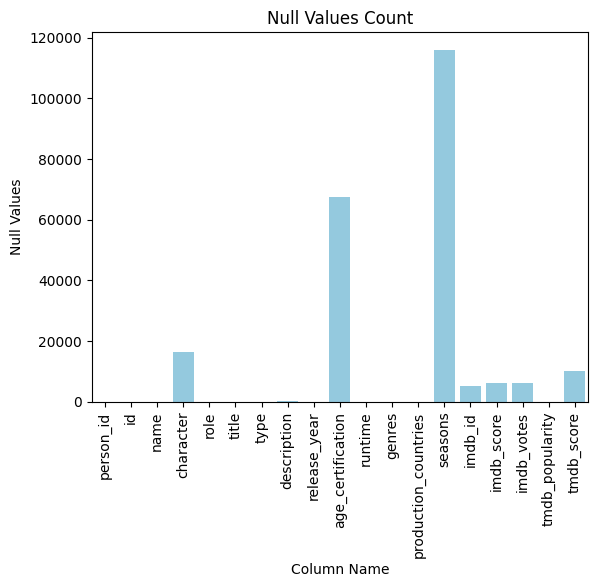

In [ ]:
#preparing a bar chart of all the null value rows using seaborn and matplotlib
sns.barplot(x=df_null_values['Column Name'], y=df_null_values['Null Values'], color='skyblue')
plt.xticks(rotation=90)
plt.title('Null Values Count')
plt.show()

## ***ii) Checking Outliers:***

In [ ]:
#creating a separate dataframe of all the numeric columns
df_numeric_columns = df[['imdb_score', 'imdb_votes', 'tmdb_popularity', 'tmdb_score']]
df_numeric_columns

,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,8.6,1092.0,15.424,7.6
1,8.6,1092.0,15.424,7.6
2,8.6,1092.0,15.424,7.6
3,8.2,89766.0,8.647,8.0
4,8.2,89766.0,8.647,8.0
...,...,...,...,...
124342,8.4,49.0,0.645,NaN
124343,8.4,49.0,0.645,NaN
124344,8.4,49.0,0.645,NaN
124345,8.4,49.0,0.645,NaN


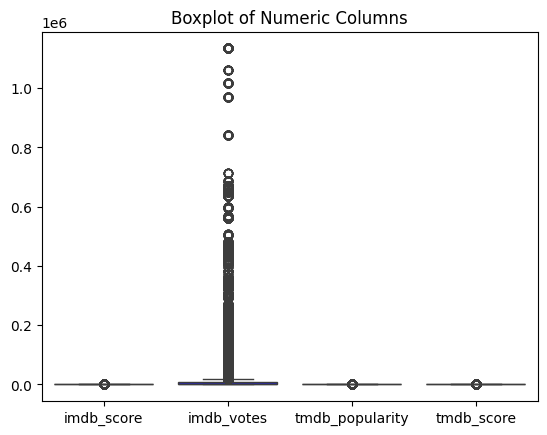

In [ ]:
# Creating a box plot using seaborn and matplotlib to show all the outliers in the numeric columns
sns.boxplot(df_numeric_columns, color='blue')
plt.title('Boxplot of Numeric Columns')
plt.show()

In [ ]:
# Creating a box plot using plotly.express to show all the outliers in the numeric columns
fig = px.box(df_numeric_columns, title='Boxplot of Numeric Columns')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

In [ ]:
#creating a separate dataframe of the outlier column
imdb_votes1= df_numeric_columns['imdb_votes']
imdb_votes1

,imdb_votes
0,1092.0
1,1092.0
2,1092.0
3,89766.0
4,89766.0
...,...
124342,49.0
124343,49.0
124344,49.0
124345,49.0


In [ ]:
#setting the Q1, Q3, IQR, Upperbound & lower bound for the outliers
Q1 = df_numeric_columns['imdb_votes'].quantile(0.25)
Q3 = df_numeric_columns['imdb_votes'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

#pointing out the outliers
outliers = imdb_votes1[(df_numeric_columns['imdb_votes'] < lower_bound) | (df_numeric_columns['imdb_votes'] > upper_bound)]
print(outliers)
print('Number of outliers:', len(outliers)) #number of outliers
print('Percentage of outliers:', len(outliers) / len(imdb_votes1) * 100) #percentage of outliers
print('Mean of outliers:', outliers.mean()) #mean of outliers
print('Median of outliers:', outliers.median()) #median of outliers
print('Mode of outliers:', outliers.mode()) #mode of outliers
print('Standard deviation of outliers:', outliers.std()) #Standard deviation of outliers
print('Variance of outliers:', outliers.var()) #Variance of outliers
print('Skewness of outliers:', outliers.skew()) #Skewness of outliers
print('Kurtosis of outliers:', outliers.kurt()) #Kurtosis of outliers
print('Range of outliers:', outliers.max() - outliers.min()) #Range of outliers
print('Interquartile range of outliers:', IQR) #Interquartile range of outliers
print('Lower bound of outliers:', lower_bound) #Lower bound of outliers
print('Upper bound of outliers:', upper_bound) #Upper bound of outliers

3         89766.0
4         89766.0
5         89766.0
6         89766.0
7         89766.0
           ...   
122347    30439.0
122348    30439.0
122349    30439.0
122350    30439.0
122351    30439.0
Name: imdb_votes, Length: 18886, dtype: float64
Number of outliers: 18886
Percentage of outliers: 15.208690680388791
Mean of outliers: 132960.58932542623
Median of outliers: 55637.0
Mode of outliers: 0    67911.0
Name: imdb_votes, dtype: float64
Standard deviation of outliers: 185871.24171425067
Variance of outliers: 34548118496.3974
Skewness of outliers: 2.789409761072976
Kurtosis of outliers: 8.880233593046004
Range of outliers: 1116430.0
Interquartile range of outliers: 6785.0
Lower bound of outliers: -9888.5
Upper bound of outliers: 17251.5


##  ***Conclusion on Outliers:***
Here as we can see that all the outliers lie in the 'imdb_votes' column & they are 15.21% of the total number of rows so here we can't remove them or even replace them with an mean/avg value because firstof all they are more than 5% and secondly, in this dataset, the outliers is exactly what we need in order to analyze the problem statements like, the most top-rated content or the most-watched content or the top 10 content i.e, the content/genre/title with the most imdb_votes(which will be an outlier in the 'imdb_votes' column) is the top performing genre/content.

Therefore, here we will just keep them as it is.

In [ ]:
#
imdb_votes1_filtered = imdb_votes1[(imdb_votes1 >= lower_bound) & (imdb_votes1 <= upper_bound)]
imdb_votes1_filtered

,imdb_votes
0,1092.0
1,1092.0
2,1092.0
293,17233.0
294,17233.0
...,...
124342,49.0
124343,49.0
124344,49.0
124345,49.0


## ***iii) Filling Null Values in numeric columns:***

In [ ]:
#replacing the null values in 'imdb_score' column with its mean value
df['imdb_score'].fillna(df['imdb_score'].mean(), inplace=True)

In [ ]:
# replacing the null values in 'imdb_votes' column with its median value since
# this column has lots of outliers
df['imdb_votes'].fillna(df['imdb_votes'].median(), inplace=True)

In [ ]:
#replacing the null values in 'tmdb_popularity' column with its mean value
df['tmdb_popularity'].fillna(df['tmdb_popularity'].mean(), inplace=True)

In [ ]:
#replacing the null values in 'tmdb_score' column with its mean value
df['tmdb_score'].fillna(df['tmdb_score'].mean(), inplace=True)

In [ ]:
#final time checking the null values
df.isnull().sum()

,0
person_id,0
id,0
name,0
character,16277
role,0
title,0
type,0
description,91
release_year,0
age_certification,67472


## ***iv) Filling Null Values in categorical columns:***

In [ ]:
#finding out the null value rows whose values are in some other format
df['production_countries'].value_counts()

,count
production_countries,
['US'],69217
['IN'],11176
['GB'],7204
['CA'],3200
[],2298
...,...
"['LB', 'US']",1
"['US', 'AF']",1
"['CN', 'DK', 'US', 'AU']",1


In [ ]:
#replacing '[]' value in 'production_countries' column with 'Null'
df['production_countries'] = df['production_countries'].replace("[]", "Null")
df['production_countries'].value_counts()

,count
production_countries,
['US'],69217
['IN'],11176
['GB'],7204
['CA'],3200
Null,2298
...,...
"['LB', 'US']",1
"['US', 'AF']",1
"['CN', 'DK', 'US', 'AU']",1


## **3) Changing Data Types**

In [ ]:
#checking the data types of all the columns & checking how many null and non-null values are there in all the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 124179 entries, 0 to 124346
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   person_id             124179 non-null  int64  
 1   id                    124179 non-null  object 
 2   name                  124179 non-null  object 
 3   character             107902 non-null  object 
 4   role                  124179 non-null  object 
 5   title                 124179 non-null  object 
 6   type                  124179 non-null  object 
 7   description           124088 non-null  object 
 8   release_year          124179 non-null  int64  
 9   age_certification     56707 non-null   object 
 10  runtime               124179 non-null  int64  
 11  genres                124179 non-null  object 
 12  production_countries  124179 non-null  object 
 13  seasons               8153 non-null    float64
 14  imdb_id               118876 non-null  object 
 15  imdb_

In [ ]:
# checking if the all the columns have a proper name & have no extra spaces
# before or after their name
df.columns

Index(['person_id', 'id', 'name', 'character', 'role', 'title', 'type',
       'description', 'release_year', 'age_certification', 'runtime', 'genres',
       'production_countries', 'seasons', 'imdb_id', 'imdb_score',
       'imdb_votes', 'tmdb_popularity', 'tmdb_score'],
      dtype='object')

In [ ]:
#checking the values of columns with object data type
df['name'].unique()

array(['Joe Besser', 'Moe Howard', 'Larry Fine', ..., 'Vijay Thakur',
       'Vanya Wellens', 'Vishwa Bhanu'], dtype=object)

In [ ]:
#checking the values of columns with object data type
df['role'].unique()

array(['ACTOR', 'DIRECTOR'], dtype=object)

In [ ]:
df['role'].value_counts()

,count
role,
ACTOR,115793
DIRECTOR,8386


## ***Conclusion on Data Types:***
We have checked all the columns and their data types and the data types of all the columns are perfectly fine.

# ***Analysis of the Dataset***

## *Problem Statements: This dataset was created to analyze all shows available on Amazon Prime Video, allowing us to extract valuable insights such as*:

### 1. Content Diversity: What genres and categories dominate the platform?
### 2. Regional Availability: How does content distribution vary across different regions?
### 3. Trends Over Time: How has Amazon Prime’s content library evolved?
### 4. IMDb Ratings & Popularity: What are the highest-rated or most popular shows on the platform?

# ***Problem Statement 1: Content Diversty***

In [ ]:
df.head()

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,59401,ts20945,Joe Besser,Joe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,31460,ts20945,Moe Howard,Moe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
2,31461,ts20945,Larry Fine,Larry,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0


In [ ]:
#creating a separate dataframe of all the dominated genres & types with their total count using groupby() & size()
dominated_content = df.groupby(['type', 'genres']).size().reset_index(name='count')
dominated_content_top_20 = dominated_content.sort_values(by='count', ascending=False).head(20)
dominated_content_top_20

,type,genres,count
833,MOVIE,['drama'],9012
369,MOVIE,['comedy'],5237
1127,MOVIE,['horror'],2447
744,MOVIE,"['drama', 'romance']",2399
503,MOVIE,['documentation'],2141
264,MOVIE,"['comedy', 'drama']",1848
1571,MOVIE,['thriller'],1848
591,MOVIE,"['drama', 'comedy']",1804
1184,MOVIE,"['romance', 'comedy']",1611
344,MOVIE,"['comedy', 'romance']",1535


In [ ]:
#creating a heatmap plot of top 20 most dominated genres & types
fig = px.density_heatmap(dominated_content_top_20, x='type', y='genres', z='count', title='Most Dominated Content')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()
#Here we have used a heatmap because we need to categorical vs categorical data

## ***Conclusion***
## Most Dominated Content: the most dominated content lies in the ['drama'] genre and is a 'Movie' with a count of 9012 followed by ['comedy'] genre which is again a 'Movie' with a count of 5237 followed by ['horror'] genre which is again a 'Movie' with a count of 2447.

In [ ]:
#creating a separate dataframe of all the dominated genres with its total count using value_counts()
dominated_genres = df['genres'].value_counts().head(10).reset_index()
dominated_genres

,genres,count
0,['drama'],9853
1,['comedy'],5582
2,"['drama', 'romance']",2512
3,['horror'],2448
4,['documentation'],2373
5,"['drama', 'comedy']",1991
6,"['comedy', 'drama']",1986
7,['thriller'],1848
8,"['romance', 'comedy']",1622
9,"['comedy', 'romance']",1608


In [ ]:
#Creating a bar graph & pie chart for the top 10 most dominated_genres
#Here we are creating a bar chart & pie chart because we need to compare categorical vs continuous data
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Creating a subplot layout with 1 row and 2 columns
# Adding custom titles for each subplot
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Bar Plot of Most Dominated Genres",  # Top-left: Histogram
                    "Pie Chart of Most Dominated Genres"),  # Top-right: Line Plot
    specs=[[{'type':'xy'}, {'type':'domain'}]] # Specifying subplot types for a 1x2 grid
)

#adding traces to the bar chart
fig.add_trace(go.Bar(x=dominated_genres['genres'],
                     y=dominated_genres['count'],
                     name='info',
                     hovertext=dominated_genres['genres']),
               row=1, col=1)

#updating X-axis and Y-axis of the bar chart
fig.update_xaxes(title_text='Genres', row=1, col=1)
fig.update_yaxes(title_text='Distribution', row=1, col=1)

fig.add_trace(go.Pie(labels=dominated_genres['genres'],
                     values=dominated_genres['count'],
                     name='info', hole = 0.3,
                     hovertext=dominated_genres['genres']),
              row=1, col=2)

#updating layout of the figure
fig.update_layout(
    height=600,
    width=1000,
    title_text='Most Dominated Genres',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',
    showlegend=True)

fig.show()

## ***Conclusion***
## Most Dominated Genres: The most dominated genre in the platform is ['drama'] followed by ['comedy'] ['drama', 'romance'], ['horror'] & ['documentation'].

In [ ]:
#creating a separate dataframe of all the dominated 'types' with its total count using value_counts()
dominated_show_type = df['type'].value_counts().reset_index()
dominated_show_type

,type,count
0,MOVIE,116026
1,SHOW,8153


In [ ]:
#Creating a bar graph & pie chart for the top 10 most dominated_show_type
#Here we are creating a bar chart & pie chart because we need to compare categorical vs continuous data
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Creating a subplot layout with 1 row and 2 columns
# Adding custom titles for each subplot
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Bar Plot of Most Dominated Categories",  # Top-left: Histogram
                    "Pie Chart of Most Dominated Ctegories"),  # Top-right: Line Plot
    specs=[[{'type':'xy'}, {'type':'domain'}]] # Specifying subplot types for a 1x2 grid
)

#adding traces to the bar chart
fig.add_trace(go.Bar(x=dominated_show_type['type'],
                     y=dominated_show_type['count'],
                     name='info',
                     hovertext=dominated_show_type['type']),
              row=1, col=1)

#updating X-axis and Y-axis of the bar chart
fig.update_xaxes(title_text='Type', row=1, col=1)
fig.update_yaxes(title_text='Distribution', row=1, col=1)

fig.add_trace(go.Pie(labels=dominated_show_type['type'],
                     values=dominated_show_type['count'],
                     name='info', hole = 0.3,
                     hovertext=dominated_show_type['type']),
              row=1, col=2)

#updating layout of the figure
fig.update_layout(
    height=600,
    width=1000,
    title_text='Most Dominated Categories',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',
    showlegend=True)


fig.show()


## ***Conclusion***
## Most Dominated Categories: The most category in the platform is 'Movie'.

# ***Problem Statement 2: Highly Rated & Most Popular Content***

In [ ]:
df.head()

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,59401,ts20945,Joe Besser,Joe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,31460,ts20945,Moe Howard,Moe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
2,31461,ts20945,Larry Fine,Larry,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0


In [ ]:
# creating a separate dataframe with 'title', 'type' & 'genres' columns having
# the mean value of 'imdb_votes' & 'tmdb_popularity' using group_by() & mean()
most_popular_content = df.groupby(['title', 'type', 'genres'])[['imdb_votes', 'tmdb_popularity']].mean().reset_index()
most_popular_content_top_20 = most_popular_content.head(20)
most_popular_content_top_20

,title,type,genres,imdb_votes,tmdb_popularity
0,#Home,MOVIE,"['drama', 'family']",12325.0,2.271
1,#Kids,SHOW,['drama'],1257.0,0.600
2,#Lucky Number,MOVIE,['comedy'],518.0,2.357
3,#SquadGoals,MOVIE,"['thriller', 'drama']",569.0,3.562
4,#Stuck,MOVIE,"['romance', 'comedy', 'drama']",1161.0,6.166
5,#UNFIT: The Psychology of Donald Trump,MOVIE,['documentation'],2529.0,4.337
6,#cats_the_mewvie,MOVIE,['documentation'],467.0,2.656
7,#martyisdead,SHOW,['drama'],1257.0,1.093
8,"$50,000 Reward",MOVIE,['western'],60.0,1.960
9,'Allo 'Allo!,SHOW,"['war', 'comedy', 'history']",25098.0,23.975


In [ ]:
#Creating a scatter plot of top 20 most popular genres based on imdb_votes & tmdb_popularity
fig = px.scatter(most_popular_content_top_20, x='tmdb_popularity', y='imdb_votes', color='genres', size='tmdb_popularity', title='Most Popular Genres ')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

## ***Conclusion***
## Most Popular Genre: The most popular genre based on imdb votes and tmdb popularity is ['drama', 'comedy', 'romance'] with tmdb popularity of 56.459 and imdb votes of 502.85k

In [ ]:
#Creating a scatter plot of top 20 most popular title names based on imdb_votes & tmdb_popularity
fig = px.scatter(most_popular_content_top_20, x='tmdb_popularity', y='imdb_votes', color='title', size='tmdb_popularity', title='Most Popular Movie Titles or Drama Titles')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

## ***Conclusion***
## Most Popular Movie/show title: The most popular title based on imdb votes and tmdb popularity is (500) Days of Summer which is a movie title in genre ['drama', 'comedy', 'romance'] with tmdb popularity of 56.459 and imdb votes of 502.85k

In [ ]:
#Creating a scatter plot of top 20 most popular show types based on imdb_votes & tmdb_popularity
fig = px.scatter(most_popular_content_top_20, x='tmdb_popularity', y='imdb_votes', color='type', size='tmdb_popularity', title='Most Popular Show Type')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

## ***Conclusion***
## Most Popular Show Type: The most popular show type based on imdb votes and tmdb popularity is 'Movie' with tmdb popularity of 56.459 and imdb votes of 502.85k

## ***Highly Rated Content Based On Imdb Score***

In [ ]:
# Creating a separate dataframe with 'title', 'type', 'genres' columns based on
# the mean of 'imdb_score' using group_by() & mean()
highly_rated_imdb_content = df.groupby(['title', 'type', 'genres'])['imdb_score'].mean().reset_index()
highly_rated_imdb_content = highly_rated_imdb_content.sort_values(by='imdb_score', ascending=False)
highly_rated_imdb_content_top_10 = highly_rated_imdb_content.head(10)
highly_rated_imdb_content_top_10

,title,type,genres,imdb_score
5290,Pawankhind,MOVIE,"['action', 'drama', 'history']",9.9
1735,Couple of Mirrors,SHOW,"['drama', 'romance', 'crime']",9.5
6896,The Chosen,SHOW,"['drama', 'history']",9.4
6613,Tari Sathe,MOVIE,"['drama', 'family']",9.4
3655,Jai Bhim,MOVIE,"['drama', 'crime']",9.3
5296,Pazhagiya Naatkal,MOVIE,['drama'],9.3
6304,Soorarai Pottru,MOVIE,"['drama', 'action']",9.2
404,Alexander Babu: Alex in Wonderland,MOVIE,['comedy'],9.2
5523,Quota,MOVIE,"['family', 'drama']",9.2
5316,Peranbu,MOVIE,['drama'],9.1


In [ ]:
#Creating two bar charts, one for imdb_score vs show_type & other for imdb_score vs genre
#Here we are using bar plots because we are comparing categorical vs continuous data
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a subplot layout with 2 rows and 2 columns
# Add custom titles for each subplot
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Bar Plot of imdb_score vs show type",  # Top-left: Histogram
                    "Bar Plot of imdb_score vs genres"  # Top-right: Line Plot

))

#adding traces to the bar chart in row1 & column1
fig.add_trace(go.Bar(x=highly_rated_imdb_content_top_10['type'],
                     y=highly_rated_imdb_content_top_10['imdb_score'],
                     name='imdb_score',
                     hovertext=highly_rated_imdb_content_top_10['title']),
               row=1, col=1)

#updating X-axis and Y-axis of the bar chart row1 & column1
fig.update_xaxes(title_text='Show Type', row=1, col=1)
fig.update_yaxes(title_text='imdb_score', row=1, col=1)

# Reorder for better grouping of similar genres in the plot
highly_rated_imdb_content_top_10 = highly_rated_imdb_content_top_10.sort_values(by=['genres', 'imdb_score'], ascending=[True, False])

# Create a combined label for the x-axis to ensure unique bars
highly_rated_imdb_content_top_10['genre_title_combined'] = highly_rated_imdb_content_top_10['genres'].astype(str) + ' - ' + highly_rated_imdb_content_top_10['title'].astype(str)

#adding traces to the bar chart row2 & column2
fig.add_trace(go.Bar(x=highly_rated_imdb_content_top_10['genre_title_combined'],
                     y=highly_rated_imdb_content_top_10['imdb_score'],
                     name='imdb_score',
                     hovertext=highly_rated_imdb_content_top_10['title']),
              row=1, col=2)

#updating X-axis and Y-axis of the bar chart row2 & column2
fig.update_xaxes(title_text='Genres - Title', row=1, col=2, tickangle=-45) # Rotate labels for better readability
fig.update_yaxes(title_text='imdb_score', row=1, col=2)

#updating layout of the figure
fig.update_layout(
    height=700,
    width=1200,
    title_text='imdb rating of content',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',
    showlegend=True)

fig.show()

## ***Conclusion***
## Highly Rated Genres & Content Type: Top rated content type by imdb score is 'Movie' & top rated genre is ['action', 'drama', 'history'].

## ***Highly Rated Content Based On tmdb Score***

In [ ]:
# Creating a separate dataframe with 'title', 'type', 'genres' columns based on
# the mean of 'tmdb_score' using group_by() & mean()
highly_rated_tmdb_content = df.groupby(['title', 'type', 'genres'])['tmdb_score'].mean().reset_index()
highly_rated_tmdb_content = highly_rated_tmdb_content.sort_values(by='tmdb_score', ascending=False)
highly_rated_tmdb_content_top_10 = highly_rated_tmdb_content.head(10)
highly_rated_tmdb_content_top_10

,title,type,genres,tmdb_score
982,Bhikari,MOVIE,"['action', 'drama', 'thriller', 'family']",10.0
5943,Savitri,MOVIE,"['romance', 'comedy', 'drama', 'family']",10.0
5997,Secrets of the Castle,SHOW,"['reality', 'documentation']",10.0
98,61st Street,SHOW,"['drama', 'crime', 'thriller']",10.0
6031,Server Sundaram,MOVIE,"['comedy', 'drama', 'romance']",10.0
6466,Streets,MOVIE,"['drama', 'thriller']",10.0
3628,"Iván Marín, ¿por qué carajos?",MOVIE,['comedy'],10.0
5754,Roadkill Garage,SHOW,"['documentation', 'comedy', 'reality']",10.0
5877,Sakka Podu Podu Raja,MOVIE,"['comedy', 'action']",10.0
7717,The Rolling Stones: From The Vault - Sticky Fi...,MOVIE,['music'],10.0


In [ ]:
#Creating two bar charts, one for tmdb_score vs show_type & other for tmdb_score vs genre
#Here we are using bar plots because we are comparing categorical vs continuous data
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a subplot layout with 2 rows and 2 columns
# Add custom titles for each subplot
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Bar Plot of tmdb_score vs show type",  # Top-left: Histogram
                    "Bar Plot of tmdb_score vs genres"  # Top-right: Line Plot

))

#adding traces to the bar chart in row1 & column1
fig.add_trace(go.Bar(x=highly_rated_tmdb_content_top_10['type'],
                     y=highly_rated_tmdb_content_top_10['tmdb_score'],
                     name='tmdb_score & title of show_type',
                     hovertext=highly_rated_tmdb_content_top_10['title']),
               row=1, col=1)

#updating X-axis and Y-axis of the bar chart row1 & column1
fig.update_xaxes(title_text='Show Type', row=1, col=1)
fig.update_yaxes(title_text='tmdb_score', row=1, col=1)


#adding traces to the bar chart row2 & column2
fig.add_trace(go.Bar(x=highly_rated_tmdb_content_top_10['genres'],
                     y=highly_rated_tmdb_content_top_10['tmdb_score'],
                     name='tmdb_score & title of genres',
                     hovertext=highly_rated_tmdb_content_top_10['title']),
              row=1, col=2)

#updating X-axis and Y-axis of the bar chart row1 & column2
fig.update_xaxes(title_text='Genres', row=1, col=2)
fig.update_yaxes(title_text='tmdb_score', row=1, col=2)

#updating layout of the figure
fig.update_layout(
    height=500,
    width=1000,
    title_text='tmdb rating of content',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',
    showlegend=True)

fig.show()

## ***Conclusion***
## Highly Rated Genres & Content Type: Top rated content type by tmdb score is 'Movie' & top rated genres by tmdb scores are ['action', 'drama', 'thriller', 'family'], ['romance', 'comedy', 'drama', 'family'], ['reality', 'documentation'], ['drama', 'crime', 'thriller'], ['comedy', 'drama', 'romance'], ['drama', 'thriller'], ['comedy'], ['documentation', 'comedy', 'reality'], ['comedy', 'action'] & ['music'].

In [ ]:
# Creating a separate dataframe with 'title', 'type', 'genres' columns based on
# the mean of 'tmdb_popularity' using group_by() & mean()
most_popular_on_tmdb_popularity = df.groupby(['genres', 'title', 'type'])['tmdb_popularity'].mean().reset_index()
most_popular_on_tmdb_popularity_top_20 = most_popular_on_tmdb_popularity.sort_values(by='tmdb_popularity', ascending=False).head(20)
most_popular_on_tmdb_popularity_top_20

,genres,title,type,tmdb_popularity
8149,['thriller'],All the Old Knives,MOVIE,1437.906
1731,['comedy'],Harina,SHOW,951.863
8294,['thriller'],The eighth clause,MOVIE,950.986
5610,"['fantasy', 'romance', 'animation', 'comedy', ...",Hotel Transylvania: Transformania,MOVIE,934.545
6917,"['scifi', 'action', 'comedy', 'family', 'fanta...",Sonic the Hedgehog,MOVIE,893.650
5513,"['fantasy', 'comedy', 'family', 'animation', '...",Clifford the Big Red Dog,MOVIE,482.744
6216,['horror'],Queen of Spades,MOVIE,429.802
5965,"['horror', 'thriller', 'drama', 'scifi']",Meander,MOVIE,389.431
3428,"['drama', 'comedy']",Suits,SHOW,356.533
829,"['comedy', 'drama', 'crime']",Better Call Saul,SHOW,352.657


In [ ]:
# Creating a separate dataframe with 'title', 'type', 'genres' columns based on
# the mean of 'imdb_votes' using group_by() & mean()
most_popular_on_imdb_votes = df.groupby(['genres', 'title', 'type'])['imdb_votes'].mean().reset_index()
most_popular_on_imdb_votes_top_20 = most_popular_on_imdb_votes.sort_values(by='imdb_votes', ascending=False).head(20)
most_popular_on_imdb_votes_top_20

,genres,title,type,imdb_votes
4273,"['drama', 'romance']",Titanic,MOVIE,1133692.0
7575,"['thriller', 'crime', 'drama']",The Usual Suspects,MOVIE,1059480.0
3866,"['drama', 'history', 'war']",Braveheart,MOVIE,1016629.0
7878,"['thriller', 'drama']",The Sixth Sense,MOVIE,967864.0
7365,"['thriller', 'action', 'scifi']",The Terminator,MOVIE,841706.0
4409,"['drama', 'thriller', 'crime']",Dexter,SHOW,711566.0
7398,"['thriller', 'action']",Skyfall,MOVIE,684779.0
7151,"['scifi', 'thriller', 'action']",District 9,MOVIE,670344.0
4298,"['drama', 'scifi', 'thriller']",Arrival,MOVIE,669220.0
7529,"['thriller', 'crime', 'drama']",Fargo,MOVIE,663221.0


In [ ]:
#Creating two bar charts, one for imdb_votes vs title & other for tmdb_popularity vs title
#Here we are using bar plots because we are comparing categorical vs continuous data
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#creating a subplot layout with 1 row and 2 columns.
#giving a titles to both subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles= ('Most Popular imdb content in a Bar Chart', #left side-Bar Graph
                     'Most Popular tmdb content in a Bar Chart'), #Right side-Pie Chart
    specs=[[{'type':'xy'}, {'type':'xy'}]] # Specifying subplot types (changed second one to 'xy')
    )

#adding traces to the bar chart in row1 & column1
fig.add_trace(
    go.Bar(
        x=most_popular_on_imdb_votes_top_20['title'],
        y=most_popular_on_imdb_votes_top_20['imdb_votes'],
        name='info', hovertext=most_popular_on_imdb_votes_top_20['genres']),
    row=1, col=1
    )

#updating X-axis and Y-axis of the bar chart row1 & column1
fig.update_xaxes(title_text='Title', row=1, col=1)
fig.update_yaxes(title_text='imdb votes', row=1, col=1)

#adding traces to the bar chart row1 & column2
fig.add_trace(
    go.Bar(
        x=most_popular_on_tmdb_popularity_top_20['title'],
        y=most_popular_on_tmdb_popularity_top_20['tmdb_popularity'],
        name='info', hovertext=most_popular_on_tmdb_popularity_top_20['genres']),
    row=1, col=2
    )

#updating X-axis and Y-axis of the bar chart row1 & column2
fig.update_xaxes(title_text='Title', row=1, col=2)
fig.update_yaxes(title_text='tmdb popularity', row=1, col=2)

#updating layout of the figure
fig.update_layout(
    height=600,
    width=1000,
    title_text='Most Popular Content',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',# Anchor the title to the center
    showlegend=True,
    )

fig.show()

## ***Conclusion***
## Most Popular Content: The most popular content in Amazon Prime as per imdb votes is 'Titanic' which is romance drama with around 1.13M votes.
## The most popular content as per tmdb popularity in Amazon Prime is 'All the old knives' which is a thriller movie with a tmdb popularity of 1437.906

# ***Problem Statement 3: Trends Over Time***

In [ ]:
df.head()

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,59401,ts20945,Joe Besser,Joe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,31460,ts20945,Moe Howard,Moe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
2,31461,ts20945,Larry Fine,Larry,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0


In [ ]:
#Creating a dataframe of genres and their release year based on their count using group_by() & size()
genre_evolution = df.groupby(['genres', 'release_year']).size().reset_index(name='count')
genre_evolution = genre_evolution.sort_values(by='release_year', ascending=True)
genre_evolution

,genres,release_year,count
2739,['drama'],1912,11
2964,"['fantasy', 'comedy', 'family']",1914,23
2977,"['fantasy', 'comedy']",1914,10
2425,"['drama', 'romance']",1915,12
3017,"['fantasy', 'family']",1915,6
...,...,...,...
2995,"['fantasy', 'drama', 'romance']",2022,8
1654,"['drama', 'action', 'crime']",2022,8
4718,"['thriller', 'horror', 'drama']",2022,40
3952,"['scifi', 'action']",2022,9


In [ ]:
#creating a line plot that shows the evolution of genres over time
#Here we are using line plot since we are evaluating trends over time
fig = px.line(genre_evolution, x='release_year', y='count', color='genres', title='Genre Evolution Over Time')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

In [ ]:
#creating a scatter plot that shows the evolution of genres over time
fig = px.scatter(genre_evolution, x='release_year', y='count', color='genres', size='count', title='Genre Evolution Over Time')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

## ***Conclusion***
## Evolution of Genres: From 1920-2020 the most dominated genre remains 'drama'.

In [ ]:
#Creating a dataframe of show types and their release year based on their size using group_by() & size()
content_type_evolution = df.groupby(['type', 'release_year']).size().reset_index(name='count')
content_type_evolution = content_type_evolution.sort_values(by='release_year', ascending=True)
content_type_evolution

,type,release_year,count
0,MOVIE,1912,11
1,MOVIE,1914,33
2,MOVIE,1915,53
3,MOVIE,1916,126
4,MOVIE,1917,8
...,...,...,...
169,SHOW,2020,769
170,SHOW,2021,987
108,MOVIE,2021,6523
109,MOVIE,2022,685


In [ ]:
#creating a line plot that shows the evolution of content type over time
#Here we are using line plot since we are evaluating trends over time
fig = px.line(content_type_evolution, x='release_year', y='count', color='type', title='Content Type Evolution Over Time')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

In [ ]:
#creating a scatter plot that shows the evolution of content type over time
fig = px.scatter(content_type_evolution, x='release_year', y='count', color='type', size='count', title='Content Type Evolution Over Time')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

In [ ]:
#creating a bar plot that shows the evolution of content type over time
#Here we are using bar plot because we are comparing categorical vs continuous columns
fig = px.bar(content_type_evolution, x='release_year', y='count', color='type', title='Content Type Evolution Over Time')
fig.update_layout(width=1000, height=500, title_x= 0.5)
fig.show()

## ***Conclusion***
## Evolution of Content Type: From 1920-2020, the 'Movie' type has always dominated the platform.

# ***Problem Statement 4: Regional Availability***

In [ ]:
df.head()

,person_id,id,name,character,role,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,59401,ts20945,Joe Besser,Joe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,31460,ts20945,Moe Howard,Moe,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
2,31461,ts20945,Larry Fine,Larry,ACTOR,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0


In [ ]:
#Creating a dataframe that shows the country and the frequency of its content using indexing & value_counts()
country_availability = df['production_countries'].value_counts().reset_index()
country_availability = country_availability.rename(columns={'count': 'Count', 'production_countries': 'Country'})
country_availability

,Country,Count
0,['US'],69217
1,['IN'],11176
2,['GB'],7204
3,['CA'],3200
4,Null,2298
...,...,...
477,"['LB', 'US']",1
478,"['US', 'AF']",1
479,"['CN', 'DK', 'US', 'AU']",1
480,"['PF', 'US', 'CA', 'FJ']",1


In [ ]:
#removing the rows where the country name is 'Null'
country_availability = country_availability[country_availability['Country'] != 'Null']
country_availability

,Country,Count
0,['US'],69217
1,['IN'],11176
2,['GB'],7204
3,['CA'],3200
5,['JP'],2114
...,...,...
477,"['LB', 'US']",1
478,"['US', 'AF']",1
479,"['CN', 'DK', 'US', 'AU']",1
480,"['PF', 'US', 'CA', 'FJ']",1


In [ ]:
#dataframe of top 10 countries
country_availability_top_10 = country_availability.head(10)
country_availability_top_10

,Country,Count
0,['US'],69217
1,['IN'],11176
2,['GB'],7204
3,['CA'],3200
5,['JP'],2114
6,['AU'],1591
7,['FR'],1490
8,['CN'],1238
9,"['GB', 'US']",1229
10,"['CA', 'US']",1175


In [ ]:
#Creating a bar chart and pie chart to show the country wise availability of content in top 10 countries
#Here we are using bar gragh & pie chart since we are comparing categorical vs continuous columns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#creating a subplot layout with 1 row and 2 columns.
#giving a titles to both subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles= ('Content Diversity in a Bar Chart', #left side-Bar Graph
                     'Content Diversity in a Pie Chart'), #Right side-Pie Chart
    specs=[[{'type':'xy'}, {'type':'domain'}]] # Specifying subplot types
    )

#creating bar graph representation of content diversity
fig.add_trace(
    go.Bar(
        x=country_availability_top_10['Country'],
        y=country_availability_top_10['Count'],
        name='Info.'),
    row=1, col=1
    )

#updating titles of x axis and y axis of bar graph
fig.update_xaxes(title_text='Country', row=1, col=1)
fig.update_yaxes(title_text='Distribution', row=1, col=1)



#creating piechart representation of content diversity
fig.add_trace(
    go.Pie(
        labels=country_availability_top_10['Country'],
        values=country_availability_top_10['Count'],
        hole=0.4),
    row=1, col=2
    )

#updating the overall layout
fig.update_layout(
    height=600,
    width=1000,
    title_text='Country wise Distribution of Content of Top 10 Countries',
    title_x = 0.5,  # Center the title
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',  # Anchor the title to the center
    showlegend=True,
    )

#for displaying the subplots
fig.show()

## ***Conclusion***
## Regional Availability: The maximum part of the content distribution lies in United States of America(US) which is 69.217k following India(IN), United Kingdom(GB), Canada(CA), Japan(JP) & Australia(AU).

In [ ]:
fig = px.bar(country_availability_top_10, x='Country', y='Count',color='Count', title='Country wise Distribution of Content')
fig.update_layout(width=500, height=500, title_x= 0.5)
fig.show()

In [ ]:
fig = px.pie(country_availability_top_10, values='Count', names='Country', hole= 0.4, title='Country wise Distribution of Content')
fig.update_layout(width=500, height=500, title_x= 0.5)
fig.show()

In [ ]:
#Creating a dataframe that shows the country wise distribution of genres and their frequency using group_by() & size()
genre_distribution = df.groupby(['production_countries', 'genres']).size().reset_index(name='count')
genre_distribution = genre_distribution.sort_values(by='count', ascending=False)
genre_distribution = genre_distribution[genre_distribution['production_countries'] != 'Null']
genre_distribution_region_wise_top_20 = genre_distribution.head(20)
genre_distribution_region_wise_top_20

,production_countries,genres,count
2932,['US'],['drama'],5158
2633,['US'],['comedy'],3713
3097,['US'],['horror'],1541
2735,['US'],['documentation'],1518
3506,['US'],['western'],1397
2877,['US'],"['drama', 'romance']",1369
2787,['US'],"['drama', 'comedy']",1209
2615,['US'],"['comedy', 'romance']",1161
3146,['US'],"['romance', 'comedy']",1151
3323,['US'],"['thriller', 'crime', 'drama']",1062


In [ ]:
#Creating a dataframe that shows the country wise distribution of content_type and their frequency using group_by() & size()
type_distribution = df.groupby(['production_countries', 'type']).size().reset_index(name='count')
type_distribution = type_distribution.sort_values(by='count', ascending=False)
type_distribution = type_distribution[type_distribution['production_countries'] != 'Null']
type_distribution_region_wise_top_20 = type_distribution.head(20)
type_distribution_region_wise_top_20

,production_countries,type,count
504,['US'],MOVIE,66999
277,['IN'],MOVIE,10814
241,['GB'],MOVIE,5820
61,['CA'],MOVIE,2953
505,['US'],SHOW,2218
201,['FR'],MOVIE,1405
242,['GB'],SHOW,1384
238,"['GB', 'US']",MOVIE,1175
313,['JP'],MOVIE,1072
59,"['CA', 'US']",MOVIE,1050


In [ ]:

import plotly.graph_objects as go
from plotly.subplots import make_subplots

#creating a subplot layout with 1 row and 2 columns.
#giving a titles to both subplots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles= ('Genre Distribution in a Bar Graph', #left side-Bar Graph
                     'Genre Distribution in a Pie Chart', #Right side-Pie Chart
                     'Show type distribution in a Bar Graph', #left side-Bar Graph
                     'Show type distribution in a Box Plot'), #Right side-Pie Chart
    specs=[[{'type':'xy'}, {'type':'domain'}], # Specifying subplot types for row 1
           [{'type':'xy'}, {'type':'xy'}]] # Specifying subplot types for row 2 (changed last one to 'xy')
    )
#Creating a bar graph to show genre distribution in top 20 countries
fig.add_trace(
    go.Bar(x=genre_distribution_region_wise_top_20['genres'], y=genre_distribution_region_wise_top_20['count'],
           name='Genre Count',
           hovertext=genre_distribution_region_wise_top_20['production_countries']),
    row=1, col=1
)

#Updating X-axis and Y-axis of bar graph
fig.update_xaxes(title_text='Genres', row=1, col=1)
fig.update_yaxes(title_text='Distribution', row=1, col=1)

#Creating a pie chart to show the genre distribution according to its frequency
fig.add_trace(go.Pie(labels=genre_distribution_region_wise_top_20['genres'],
                     values=genre_distribution_region_wise_top_20['count'], hole=0.4, name='Genre Distribution'),
              row=1, col=2
)

#Creating a bar graph to show content_type distribution in top 20 countries
fig.add_trace(go.Bar(x=type_distribution_region_wise_top_20['type'],
                     y=type_distribution_region_wise_top_20['count'],
                     name='Show Type Count',
                     hovertext=type_distribution_region_wise_top_20['production_countries']),
              row=2, col=1
)

#Updating X-axis and Y-axis of bar graph
fig.update_xaxes(title_text='Type', row=2, col=1)
fig.update_yaxes(title_text='Distribution', row=2, col=1)


#Creating a box plot to show the content_type distribution according to its frequency
fig.add_trace(go.Box(x=type_distribution_region_wise_top_20['type'],
                     y=type_distribution_region_wise_top_20['count']),
              row=2, col=2
)

#Updating the layout of the figure
fig.update_layout(
    height=1200,
    width=1200,
    title_text='Distribution of Genres & Show Types by Production Country (Top 20)',
    title_x = 0.5,
    title_y = 0.95,  # Position the title at the top
    titlefont=dict(size=24),  # Set the font size of the title
    title_xanchor='center',  # Anchor the title to the center
    showlegend=True,
    )

fig.show()

## ***Conclusion***
## Regional Availability: i) The most viewed genre is 'drama' & its maximum viewership is in US which is 5158
##                       ii) The most viewed content_type is 'Movie' & its maximum viewership is in US which is 66.999k